### 事前準備

In [1]:
import os

# 初期設定
COLAB_FLG = False # COLABで実行する場合はTrue, それ以外で実行する場合はFalse

if COLAB_FLG:
    from google.colab import drive
    drive.mount('/content/gdrive') # マウント先
    ATTACH_PATH = '/content/gdrive/MyDrive/object_detection_practice'  # 保存先のベースディレクトリ
else:
    ATTACH_PATH = '.'  # ローカルならカレントディレクトリ
    
    
SAVE_MODEL_PATH = f'{ATTACH_PATH}/model/'  # モデルの保存先

# 保存先のディレクトリを作成する
os.makedirs(SAVE_MODEL_PATH, exist_ok=True)

### 環境構築とデータセットの準備

In [2]:
!pip install -q pytorch_lightning tensorboard
!pip install -q -U albumentations
!pip install "opencv-python-headless<4.3"

     |████████████████████████████████| 700 kB 12.1 MB/s 
     |████████████████████████████████| 596 kB 46.3 MB/s 
     |████████████████████████████████| 5.8 MB 46.5 MB/s 
     |████████████████████████████████| 419 kB 49.4 MB/s 
     |████████████████████████████████| 141 kB 55.1 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.8.2+zzzcolab20220719082949 requires tensorboard<2.9,>=2.8, but you have tensorboard 2.9.1 which is incompatible.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 21.6 MB 62.5 MB/s 
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.6.0.66
    Uninstalling opencv-python-headless-4.6.0.66:
      Successfully uninstalled opencv-python-headless-4.6.0.66


In [3]:
# 評価指標 mAPのダウンロード
%%capture
!if [ ! -d vision ]; then git clone https://github.com/pytorch/vision.git && cd vision && cp references/detection/utils.py ../ && cp references/detection/transforms.py ../ && cp references/detection/coco_eval.py ../ && cp references/detection/engine.py ../ && cp references/detection/coco_utils.py ../; fi

In [4]:
# データセットのダウンロード
%%capture
!if [ ! -d BCCD_Dataset ]; then git clone https://github.com/Shenggan/BCCD_Dataset.git; fi

In [5]:
!ls

BCCD_Dataset  coco_utils.py  model	  transforms.py  vision
coco_eval.py  engine.py      sample_data  utils.py


In [6]:
import numpy as np
import matplotlib.pyplot as plt

from PIL import Image
from PIL import ImageDraw, ImageFont

import torch
import torchvision
from torchvision import transforms
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.ops import batched_nms

import pytorch_lightning as pl
from pytorch_lightning.callbacks import ModelCheckpoint
from pytorch_lightning.callbacks.early_stopping import EarlyStopping

import albumentations as A
from albumentations.pytorch import ToTensorV2

from xml.etree.ElementTree import parse

from engine import evaluate

In [7]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda', index=0)

### Datasetの定義

In [8]:
class BCCDDataset(torch.utils.data.Dataset):

    def __init__(self, root, mode='train'):
        self.root = root
        self.mode = mode
        self.bccd_labels = ['BG', 'RBC', 'WBC', 'Platelets']
        with open(f'{root}/ImageSets/Main/{mode}.txt', 'r') as f:
            self.data_list = f.read().split('\n')[:-1]
        
        bbox_params = A.BboxParams(format='pascal_voc', label_fields=['class_labels'])

        # 訓練時のみデータ拡張の変換
        if self.mode == 'train':
            self.transform = A.Compose([
                A.HorizontalFlip(p=0.1),
                A.VerticalFlip(p=0.1),
                A.RandomBrightnessContrast(p=0.1),
                ToTensorV2(),
              ], bbox_params=bbox_params)
        # 検証とテストデータにはデータ拡張の処理はなし
        else:
            self.transform = A.Compose([ ToTensorV2() ], bbox_params=bbox_params)


    def __getitem__(self, idx):
        data = self.data_list[idx]

        # 入力値
        image_path = f'{self.root}/JPEGImages/{data}.jpg'
        image = Image.open(image_path)
        image = np.array(image)

        # 目標値
        anno_path = f'{self.root}/Annotations/{data}.xml'
        parser = parse(anno_path)
        boxes, labels = [], []
        for obj in parser.findall('object'):
            bndbox = obj.find('bndbox')
            if bndbox.find('xmin').text != bndbox.find('xmax').text:
                box = [int(tag.text) for tag in bndbox] # box=[xmin, ymin, xmax, ymax]
                label = obj.find('name').text
                label = self.bccd_labels.index(label) # ラベルを要素番号（1, 2, 3...）に
                boxes.append(box)
                labels.append(label)
        boxes = torch.tensor(boxes, dtype=torch.float32) # 回帰：float32
        labels = torch.tensor(labels, dtype=torch.int64) # 分類：int

        # データ拡張
        transformed = self.transform(image=image, bboxes=boxes, class_labels=labels)
        image = transformed['image'] / 255 # 0 - 1にリサイズ
        boxes = torch.tensor(transformed['bboxes'], dtype=torch.float32)
        labels = torch.tensor(transformed['class_labels'], dtype=torch.int64)

        # mAP 算出用に追加
        image_id = torch.tensor([idx])                                              # image_id: 画像の番号
        area = (boxes[:, 2] - boxes[:, 0]) * (boxes[:, 3] - boxes[:, 1])            # area: 矩形の面積  (xmax - xmin) * (ymax - ymin)
        iscrowd = torch.zeros((len(parser.findall('object')),), dtype=torch.int64)  # iscrowd: 特に不要のため 0 を指定

        target = {'boxes': boxes, 'labels': labels, 'image_id': image_id, 'area': area, 'iscrowd': iscrowd}

        return image, target


    def __len__(self):
        return len(self.data_list)

In [9]:
# データセットの取得
root = 'BCCD_Dataset/BCCD'
train = BCCDDataset(root, mode='train')
val = BCCDDataset(root, mode='val')
test = BCCDDataset(root, mode='test')

len(train), len(val), len(test)

(205, 87, 72)

### DataLoader

In [10]:
# データセットの形式を揃える
def collate_fn(batch):
    return list(zip(*batch))

# バッチサイズ
batch_size = 8

# Data Loader の定義
train_loader = torch.utils.data.DataLoader(train, batch_size, shuffle=False, drop_last=True, collate_fn=collate_fn)
val_loader = torch.utils.data.DataLoader(val, batch_size, collate_fn=collate_fn)
test_loader = torch.utils.data.DataLoader(test, batch_size, collate_fn=collate_fn)

### ネットワークの定義と訓練

In [11]:
class Net(pl.LightningModule):

    def __init__(self, n_feature=1024, n_class=4):
        super().__init__()

        self.faster_rcnn = fasterrcnn_resnet50_fpn(pretrained=True)
        self.faster_rcnn.roi_heads.box_predictor = FastRCNNPredictor(n_feature, n_class)

    
    def forward(self, x, t=None):
        if self.training:
            return self.faster_rcnn(x, t) # => loss
        else:
            return self.faster_rcnn(x) # => y
    

    def training_step(self, batch, batch_idx):
        x, t = batch
        losses = self(x, t)
        loss = sum(losses.values())
        self.log('train_loss', loss, on_step=True, on_epoch=True, prog_bar=True)
        return loss


    def validation_step(self, batch, batch_idx):
        x, t = batch
        losses = self.train().forward(x, t) # valの時もlossを計算させるため、強制的にtrainモードにする
        loss = sum(losses.values())
        self.log('val_loss', loss, on_step=False, on_epoch=True)
        return loss

      
    def test_step(self, batch, batch_idx):
        x, t = batch
        losses = self.train().forward(x, t) # testの時もlossを計算させるため、強制的にtrainモードにする
        loss = sum(losses.values())
        self.log('test_loss', loss, on_step=False, on_epoch=True)
        return loss


    def configure_optimizers(self):
        params = [p for p in self.faster_rcnn.parameters() if p.requires_grad]
        optimizer = torch.optim.Adam(params)
        return optimizer

In [12]:
# callbacksの定義
model_checkpoint = ModelCheckpoint(
    SAVE_MODEL_PATH,
    filename="faster-RCNN"+"{epoch:02d}-{val_loss:.2f}",
    monitor='val_loss',
    mode='min',
    save_top_k=1,
    save_last=False,
)
early_stopping = EarlyStopping(
    monitor='val_loss',
    mode='min',
    patience=10,
)

In [13]:
# 訓練の実行
pl.seed_everything(0)
net = Net()
trainer = pl.Trainer(max_epochs=100, gpus=1)
trainer.fit(net, train_loader, val_loader)

Global seed set to 0
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth


  0%|          | 0.00/160M [00:00<?, ?B/s]

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:446: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
  f"Setting `Trainer(gpus={gpus!r})` is deprecated in v1.7 and will be removed"
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
Missing logger folder: /content/lightning_logs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name        | Type       | Params
-------------------------------------------
0 | faster_rcnn | FasterRCNN | 41.3 M
-------------------------------------------
41.1 M    Trainable params
222 K     Non-trainable params
41.3 M    Total params
165.238   Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilities/data.py:87: UserWarning: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 3. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.
  "Trying to infer the `batch_size` from an ambiguous collection. The batch size we"
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1895: PossibleUserWarning: The number of training batches (25) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
  category=PossibleUserWarning,


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

`Trainer.fit` stopped: `max_epochs=100` reached.


In [14]:
# テストデータで検証
results = trainer.test(dataloaders=test_loader)

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1389: UserWarning: `.test(ckpt_path=None)` was called without a model. The best model of the previous `fit` call will be used. You can pass `.test(ckpt_path='best')` to use the best model or `.test(ckpt_path='last')` to use the last model. If you pass a value, this warning will be silenced.
  + f" You can pass `.{fn}(ckpt_path='best')` to use the best model or"
Restoring states from the checkpoint path at /content/lightning_logs/version_0/checkpoints/epoch=99-step=2500.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
Loaded model weights from checkpoint at /content/lightning_logs/version_0/checkpoints/epoch=99-step=2500.ckpt


Testing: 0it [00:00, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_loss           0.6758349537849426
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


In [15]:
# Start tensorboard.
%load_ext tensorboard
%tensorboard --logdir lightning_logs/

Output hidden; open in https://colab.research.google.com to view.

### 推論結果の確認

In [ ]:
# フォントのダウンロード
%%capture
!if [ ! -d fonts ]; then mkdir fonts && cd fonts && wget https://noto-website-2.storage.googleapis.com/pkgs/NotoSansCJKjp-hinted.zip && unzip NotoSansCJKjp-hinted.zip && cd .. ;fi

In [ ]:
def visualize_results(input, output):

    bccd_labels = ['BG', 'RBC', 'WBC', 'Platelets']

    image= input.permute(1, 2, 0).numpy()
    image = Image.fromarray((image*255).astype(np.uint8))

    # 採用する boxes の要素番号が返り値で得られる
    keep = batched_nms(boxes=output['boxes'], scores=output['scores'], idxs=output['labels'], iou_threshold=0.2)

    boxes = output['boxes'].cpu().detach().numpy()
    labels = output['labels'].cpu().detach().numpy()
    scores = output['scores'].cpu().detach().numpy()

    if 'scores' in output.keys():
        boxes, labels, scores = boxes[keep], labels[keep], scores[keep]
        boxes = boxes[scores > 0.5]
        labels = labels[scores > 0.5]

    draw = ImageDraw.Draw(image)
    font = ImageFont.truetype('fonts/NotoSansCJKjp-Bold.otf', 16)
    for box, label in zip(boxes, labels):
        # box
        draw.rectangle(box, outline='red')
        # label
        text = bccd_labels[label]
        w, h = font.getsize(text)
        draw.rectangle([box[0], box[1], box[0]+w, box[1]+h], fill='red')
        draw.text((box[0], box[1]), text, font=font, fill='white')

    return image

In [23]:
# 訓練データの 1 サンプル目に対して予測値を算出
net.cpu().eval()
x, t = test[0]
y = net(x.unsqueeze(0))[0]

In [ ]:
#y

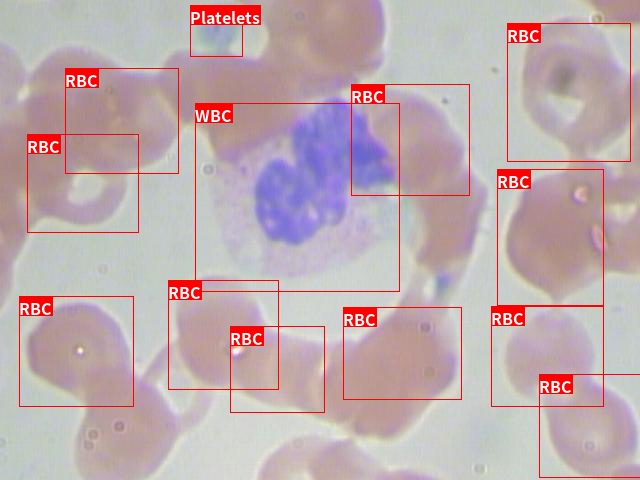

In [24]:
visualize_results(x, y)

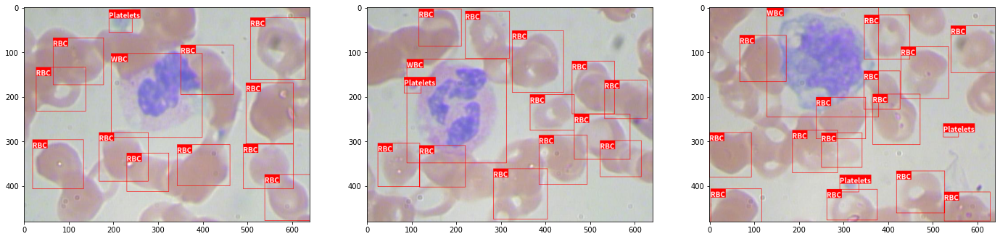

In [25]:
# 3 枚で確認
plt.figure(figsize=(24, 12))
net.eval()
for n in range(3):
    x, t = test[n]
    y = net(x.unsqueeze(0))[0]
    image = visualize_results(x, y)
    plt.subplot(1, 3, n+1)
    plt.imshow(image)

### 評価指標（mean Average Precision (mAP) ）

In [26]:
# mAP の算出
pl.seed_everything(0)
net.to(device)
evaluate(net, test_loader, device)

Global seed set to 0


creating index...
index created!
Test:  [0/9]  eta: 0:00:05  model_time: 0.4455 (0.4455)  evaluator_time: 0.0746 (0.0746)  time: 0.6366  data: 0.1117  max mem: 8194
Test:  [8/9]  eta: 0:00:00  model_time: 0.4394 (0.4405)  evaluator_time: 0.0551 (0.0565)  time: 0.6046  data: 0.1027  max mem: 8194
Test: Total time: 0:00:05 (0.6049 s / it)
Averaged stats: model_time: 0.4394 (0.4405)  evaluator_time: 0.0551 (0.0565)
Accumulating evaluation results...
DONE (t=0.04s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.565
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.894
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.632
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.317
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.425
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.435
 Average Recall     (AR) @[ IoU=0.50